# **Détection de feature importants sur la prediction et classification des petites plantes**
# Réaliser par **TAFZA Hanae et Ibtissam LABYADY**

<img src="https://images.pexels.com/photos/5230966/pexels-photo-5230966.jpeg?auto=compress&cs=tinysrgb&w=1260&h=750&dpr=1" width="600px">


# **Problématique :**
La compétition intense entre les plantes en phase de croissance précoce pour les nutriments et l'eau représente un défi majeur pour l'industrie agricole. Cette phase est souvent déterminante pour qu'une plante puisse l'emporter sur toutes les autres plantules. La détection précoce des plantes sauvages au cours de cette phase critique pourrait permettre de les éliminer manuellement, offrant ainsi un avantage aux plantules cultivées.

# **Objectif :**
Le développement d'un modèle capable de classer correctement les espèces de plantules à partir d'une image vise à résoudre cette problématique. En parvenant à cette tâche, nous cherchons à fournir une solution pour identifier et éliminer manuellement les plantes sauvages en phase précoce, offrant ainsi un avantage concurrentiel aux plantules cultivées dans l'industrie agricole.



## Table of contents

**1. importation des bibliobibliothèques**
**2. Analyse de données**
**3. Visualisation**
**4. Prétraitement des images**
**5. Modeling**
**6. validation**

In [28]:
run_training=True

## Install libraries <a class="anchor" id="load"></a>



In [30]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

from PIL import Image
from imageio import imread

import seaborn as sns
sns.set_style("dark")
sns.set()

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler

import torchvision
from torchvision import datasets, models, transforms
from torch.utils.data.dataset import Subset
from torch.utils.data import DataLoader
import torch.nn.functional as F

from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

from IPython.display import HTML

import time
import copy
from tqdm import tqdm_notebook as tqdm
import cv2

from os import listdir, makedirs, getcwd, remove
from os.path import isfile, join, abspath, exists, isdir, expanduser

from lime import lime_image
from skimage.segmentation import mark_boundaries

les données dont on a besoin:

In [31]:
listdir("../input")

['pretrained-pytorch-models', 'v2-plant-seedlings-dataset', 'seedlingsmodel']


****En utilisant les modèles pré-entraînés de **PyTorch**, nous allons en choisir un pour le transfert d'apprentissage afin de prédire les classes d'espèces. Le transfert d'apprentissage est une technique qui consiste à utiliser un modèle pré-entraîné sur une tâche similaire comme point de départ pour résoudre une nouvelle tâche ou un nouveau problème.

In [32]:
listdir("../input/seedlingsmodel")

['running_losses_segmented_seedlings.csv',
 'segmented_seedlings_cuda.pth',
 'losses_segmented_seedlings.csv']

Ce modèle est celui que nous obtenons après avoir exécuté la boucle d'entraînement dans ce noyau. Je l'ai enregistré dans un ensemble de données distinct afin d'accélérer l'exécution de ce noyau à chaque modification du notebook.

## fichier des images <a class="anchor" id="peek"></a>

In [33]:
base_path = "../input/v2-plant-seedlings-dataset/nonsegmentedv2/"
OUTPUT_PATH = "seedlings.pth"
MODEL_PATH = "../input/seedlingsmodel/seedlings.pth"

* The output path describes where to save a trained model after running the training loop in this kernel. 
* The model path instead describes where to load an already trained model of this kernel. 
* The basepath directs to the images data of the seedlings.

### **Visulasitaion des images pour chaque espèce** <a class="anchor" id="speciescount"></a>

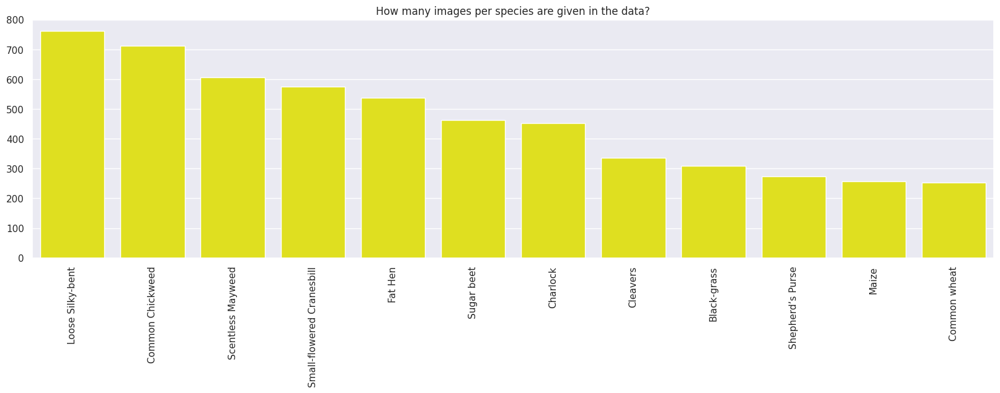

In [40]:
subfolders = listdir(base_path)
names = []
counts = []

for folder in subfolders:
    images = listdir(base_path +folder)
    names.append(folder)
    counts.append(len(images))

counts = np.array(counts)
names = np.array(names)

idx = np.argsort(counts)[::-1]
    
plt.figure(figsize=(20, 5))    
sns.barplot(x=names[idx], y=counts[idx], color="yellow")
plt.xticks(rotation=90)
plt.title("How many images per species are given in the data?")
plt.show()


### Intérpretation

*Nous avons beaucoup d'images qui correspondent à des plantes sauvages telles que le loose silky-bent, le common chickweed, le scentless mayweed, le small-flowered cransbill, le fat hen, le charlock, le cleavers, le black-grass et le shepherd's purse.
*En revanche, les plantules appartenant à des plantes agricoles communes comme la betterave à sucre, le maïs et le blé commun sont moins présentes.
*Nous devons faire face à un déséquilibre de classe.

### Visualisation des différentes espèces  <a class="anchor" id="examples"></a>

/tmp/ipykernel_42/113290944.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imread(base_path + folder + "/" + files[0])


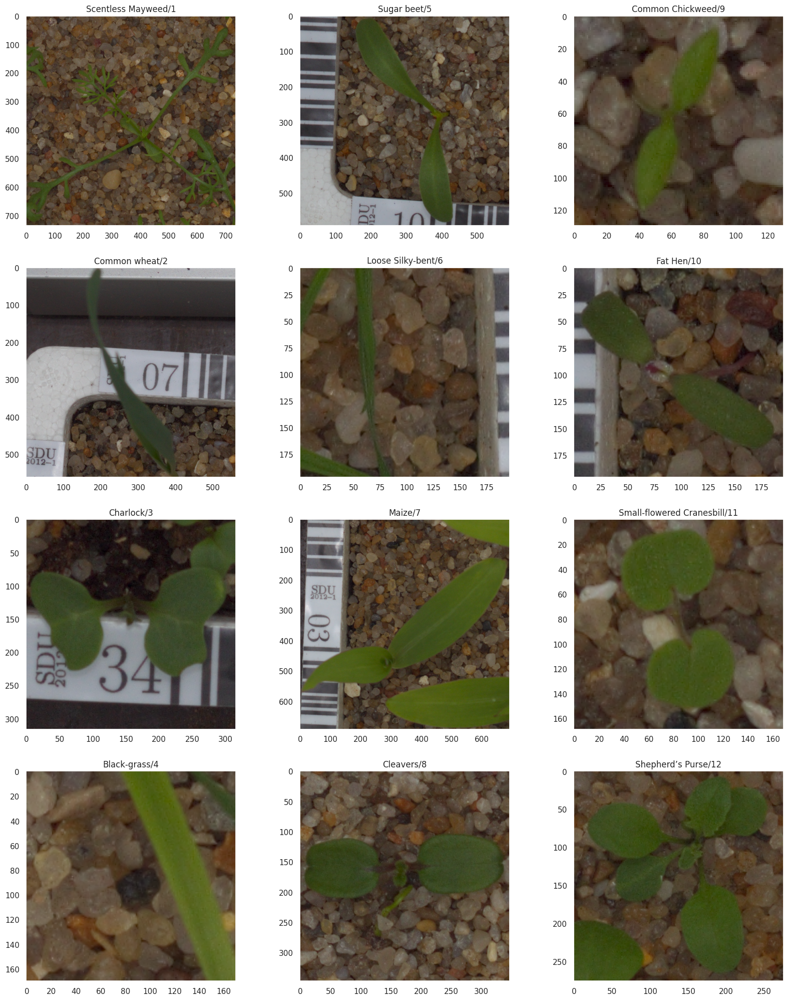

In [36]:
fig, ax = plt.subplots(4,3,figsize=(20,25))

for m in range(4):
    for n in range(3):
        folder = subfolders[m+n*4]
        files = listdir(base_path + folder + "/")
        image = imread(base_path + folder + "/" + files[0])
        ax[m,n].imshow(image)
        ax[m,n].grid(False)
        ax[m,n].set_title(folder + "/" + str(m+n*4+1))

### Interpretation
* Les images des plantules ont été prises à différentes échelles. Les zones d'image diffèrent dans les plages de pixels (hauteur et largeur). 
* 
* En examinant les pierres, nous pouvons voir que les images avec une hauteur et une largeur plus grandes sont zoomées (petites pierres), tandis que les petites images sont zoomées (plus grandes pierres).
* 
* De plus, nous pouvons voir du matériel supplémentaire dans certaines images : un ruban de mesure et une paroi de conteneur.
* 
* Enfin, mais non le moindre, certaines images semblent être floues et hors de mise au point.
* 
* Nous devons encore vérifier d'autres éléments en itérant à travers les images. 



### Numeration des images fichiers <a class="anchor" id="filenames"></a>



In [41]:
listdir(base_path + "Maize")[0:10]

['173.png',
 '248.png',
 '94.png',
 '236.png',
 '48.png',
 '227.png',
 '238.png',
 '61.png',
 '222.png',
 '37.png']

/tmp/ipykernel_42/2500543843.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imread(base_path + folder + "/" + str(idx) + ".png")


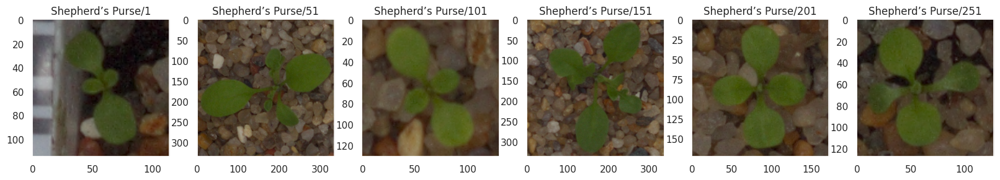

In [42]:
image_indices = np.array([0, 50, 100, 150, 200, 250])+1

fig, ax = plt.subplots(1,6,figsize=(20,5))

for n in range(6):
    idx = image_indices[n]
    image = imread(base_path + folder + "/" + str(idx) + ".png")
    ax[n].imshow(image)
    ax[n].grid(False)
    ax[n].set_title(folder + "/" + str(idx))


*  la numérotation des images ne semble pas être corrélée avec le niveau de zoom des images d'une espèce particulière.

### verification si la taille des images permet pas de déterminer l'état de croissance de l'espèce de manière fiable.<a class="anchor" id="reveal"></a>

chargeons toutes les images une par une et stockons l'espèce ainsi que la hauteur et la largeur de l'image dans un dataframe pandas :

In [44]:
total_images = 0
for folder in subfolders:
    total_images += len(listdir(base_path + folder))

plantstate = pd.DataFrame(index=np.arange(0, total_images), columns=["width", "height", "species"])

k = 0
all_images = []
for m in range(len(subfolders)):
    folder = subfolders[m]
    
    images = listdir(base_path + folder)
    all_images.extend(images)
    n_images = len(images)
    
    for n in range(0, n_images):
        image = imread(base_path + folder + "/" + images[n])
        plantstate.loc[k, "width"] = image.shape[0]
        plantstate.loc[k, "height"] = image.shape[1]
        plantstate.loc[k, "species"] = folder
        plantstate.loc[k, "image_name"] = images[n]
        k+=1

plantstate["width"] = plantstate["width"].astype(int)
plantstate["height"] = plantstate["height"].astype(int)


/tmp/ipykernel_42/2549130452.py:17: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imread(base_path + folder + "/" + images[n])
/tmp/ipykernel_42/2549130452.py:17: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imread(base_path + folder + "/" + images[n])


In [45]:
plantstate.head()

,width,height,species,image_name
0,735,735,Scentless Mayweed,173.png
1,148,148,Scentless Mayweed,491.png
2,99,99,Scentless Mayweed,379.png
3,106,106,Scentless Mayweed,248.png
4,135,135,Scentless Mayweed,94.png


In [46]:
plantstate.shape

(5539, 4)

/tmp/ipykernel_42/971892695.py:17: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(plantstate.width, ax=ax[2], color="orange");


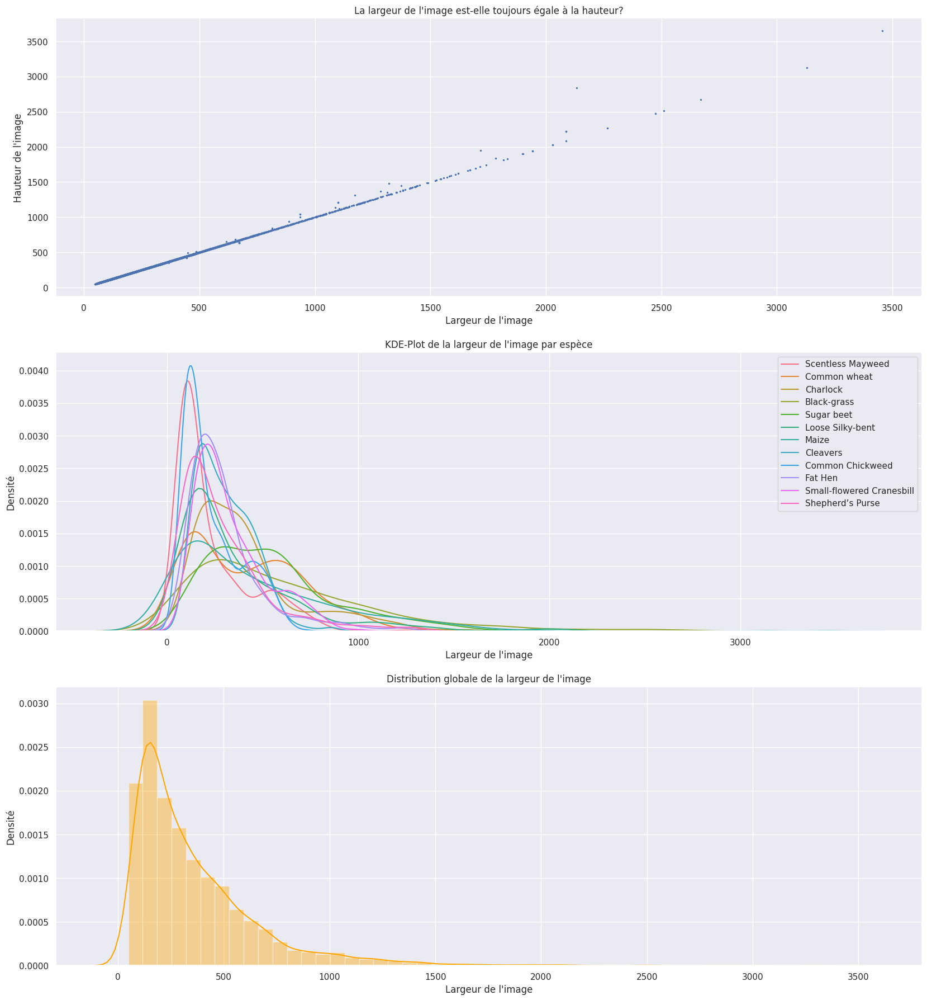

In [48]:
custom_palette = sns.color_palette("husl", n_colors=len(plantstate.species.unique()))

fig, ax = plt.subplots(3, 1, figsize=(20, 22))
ax[0].scatter(plantstate.width.values, plantstate.height.values, s=2)
ax[0].set_xlabel("Largeur de l'image")
ax[0].set_ylabel("Hauteur de l'image");
ax[0].set_title("La largeur de l'image est-elle toujours égale à la hauteur?")

for i, single in enumerate(plantstate.species.unique()):
    sns.kdeplot(plantstate[plantstate.species==single].width, ax=ax[1], label=single, color=custom_palette[i]);

ax[1].legend();
ax[1].set_title("KDE-Plot de la largeur de l'image par espèce")
ax[1].set_xlabel("Largeur de l'image");
ax[1].set_ylabel("Densité")

sns.distplot(plantstate.width, ax=ax[2], color="orange");
ax[2].set_xlabel("Largeur de l'image")
ax[2].set_ylabel("Densité")
ax[2].set_title("Distribution globale de la largeur de l'image");


#### Interpretation

Explication :
Carré et Valeurs Aberrantes :
La mention que la plupart des images sont carrées indique que leur hauteur et leur largeur sont approximativement égales. Cela peut être dû à la manière dont les images ont été acquises ou prétraitées. Cependant, il y a également des valeurs aberrantes, c'est-à-dire des images qui se distinguent des autres en termes de dimensions. Ces valeurs aberrantes peuvent nécessiter un examen plus approfondi pour comprendre pourquoi elles diffèrent et décider si elles doivent être exclues de l'analyse.

Tracés de Densité Kernel (KDE) des Espèces :
Les tracés de densité kernel permettent de visualiser la distribution des tailles d'image pour chaque espèce. Les observations mentionnées sont les suivantes :

Valeurs Aberrantes Extrêmes : Presque toutes les espèces présentent des valeurs aberrantes extrêmes. Cela suggère que certaines images sont très différentes en termes de dimensions par rapport à la majorité des images de la même espèce.

Deux Groupes Principaux de Tailles d'Image : Il existe au moins deux groupes distincts de tailles d'image. Cela pourrait indiquer une variabilité significative dans les dimensions des images, peut-être en raison de différentes conditions de capture ou de sources.

Distribution Inclinée vers la Droite : Toutes les distributions sont inclinées vers la droite, ce qui signifie que les images plus petites sont plus fréquentes. Cela peut avoir des implications sur la manière dont le modèle doit être entraîné, car il sera probablement plus confronté à des images plus petites.

### Découvrir la fuite cible <a class="anchor" id="targetleakage"></a>

Sur les tracés kde des largeurs d'image par espèce, nous avons observé qu'il existe au moins deux groupes de formes d'image qui peuvent être en corrélation avec l'état de croissance d'une plante. Examinons de plus près l'état de croissance logarithmique :

/tmp/ipykernel_42/2084059623.py:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(np.log(plantstate.width.values), ax=ax[1], bins=100, kde=False);


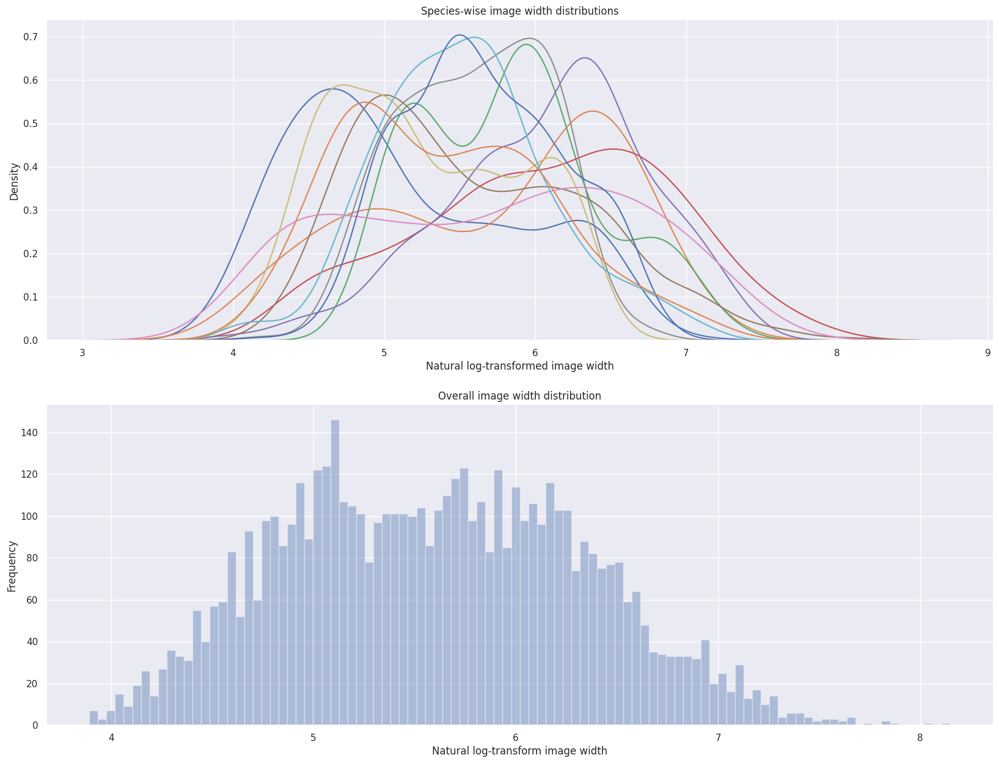

In [49]:
fig, ax = plt.subplots(2,1,figsize=(20,15))
for single in plantstate.species.unique():
    sns.kdeplot(np.log(plantstate[plantstate.species==single].width.values), label=single, ax=ax[0]);
ax[0].set_title("Species-wise image width distributions")
ax[0].set_xlabel("Natural log-transformed image width")
ax[0].set_ylabel("Density");
sns.distplot(np.log(plantstate.width.values), ax=ax[1], bins=100, kde=False);
ax[1].set_xlabel("Natural log-transform image width")
ax[1].set_ylabel("Frequency")
ax[1].set_title("Overall image width distribution");

#### Interpretation

* En prenant le logarithme naturel des largeurs des images, nous pouvons observer bien plus de 2 groupes (entre 3 et 5).
* Le groupe auquel une image appartient dépend fortement de l'espèce de la plante !
* Par conséquent, la probabilité d'observer une espèce spécifique est déterminée par la forme de l'image !!!
* Vous pourriez dire que cette fuite n'est pas présente si nous redimensionnons les images, mais elle persiste, car l'état de croissance est également reflété par la taille des pierres dans les images !
* Cela conduit à l'hypothèse suivante sur la collecte de données : Les photos ont été prises à des moments spécifiques pour couvrir différents états de croissance de toutes les plantes. Pour être pleinement couvertes par l'image, certaines espèces de plantes nécessitent des images plus grandes que d'autres à un moment donné.    

#### Regroupement des états de croissance <a class="anchor" id="statecluster"></a>

Pour visualiser les différentes probabilités d'espèces par état de croissance, regroupons les états de croissance avec une approche de k-means simple et créons une carte thermique (heatmap) des fréquences des espèces en fonction de l'état de croissance.:

In [50]:
scaler = StandardScaler()

X = np.log(plantstate.width.values).reshape(-1,1)
X = scaler.fit_transform(X)

km = KMeans(n_clusters=5)
plantstate["growth_state"] = km.fit_predict(X)

/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [51]:
mean_states = plantstate.groupby("growth_state").width.mean().values
state_order = np.argsort(mean_states)
mean_states

array([ 298.03050109,   96.31595745,  522.74301242,  168.59770938,
       1034.25884544])

mean_states est un tableau des moyennes de largeur pour chaque état de croissance, et state_order est l'ordre de tri correspondant. Ces informations peuvent être utilisées pour visualiser ou analyser les moyennes de largeur en fonction des différents états de croissance.

/tmp/ipykernel_42/583123182.py:10: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imread(base_path + species[m] + "/" + image_id)
/tmp/ipykernel_42/583123182.py:10: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imread(base_path + species[m] + "/" + image_id)
/tmp/ipykernel_42/583123182.py:10: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imread(base_path + spe

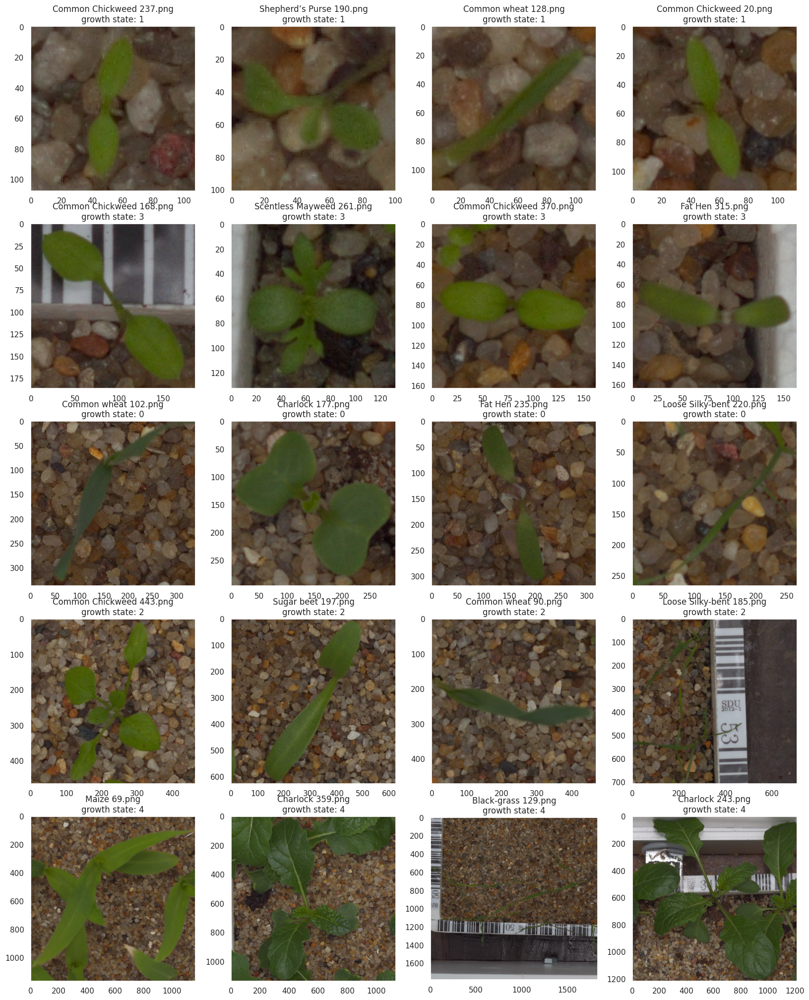

In [52]:
fig, ax = plt.subplots(len(state_order), 4, figsize=(20,5*len(state_order)))

for n in range(len(state_order)):
    your_state=state_order[n]

    example = np.random.choice(plantstate[plantstate.growth_state==your_state].index.values, size=4)
    species = plantstate.loc[example].species.values
    for m in range(4):
        image_id = all_images[example[m]]
        image = imread(base_path + species[m] + "/" + image_id)
        ax[n,m].imshow(image)
        ax[n,m].set_title(species[m] + " " + image_id + "\n" + "growth state: " + str(your_state))
        ax[n,m].grid(False);


vous pouvez clairement voir que la taille de l'image est liée à l'état de croissance des plantes ! 

#### **Exploration de la fuite**

Text(0.5, 1.0, 'The growth state is related to the species!')

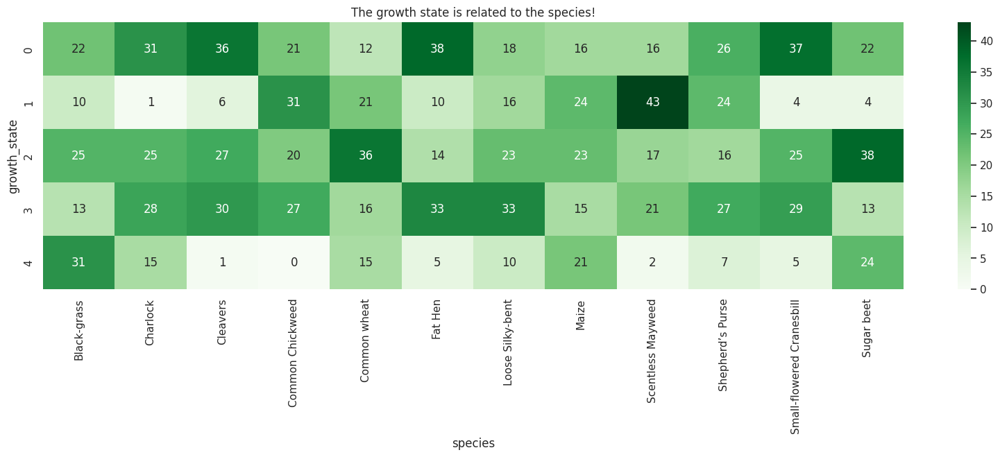

In [55]:
target_leakage = plantstate.groupby(["growth_state", "species"]).size().unstack().fillna(0)
target_leakage = target_leakage / plantstate.species.value_counts() * 100
target_leakage = target_leakage.apply(np.round).astype(int)  # Change np.int to int

plt.figure(figsize=(20, 5))
sns.heatmap(target_leakage, cmap="Greens", annot=True)  # Change cmap to "Greens"
plt.title("The growth state is related to the species!")



### Interpretation:

* Dans cette analyse, nous avons découvert une fuite de données importante qui pourrait compromettre les performances de notre modèle. Cette fuite découle du fait que la taille des images est liée à l'état de croissance des plantes, et par conséquent, elle est également liée à la probabilité d'observer une espèce spécifique. Plus précisément, certaines espèces sont plus susceptibles d'être observées à des états de croissance particuliers en raison de leurs caractéristiques de taille d'image.
* 
* Prenons l'exemple de la camomille inodore (scentless mayweed) qui est une espèce courante dans l'ensemble de données. Nous avons constaté que 43 % des plantes de cette classe se trouvent à l'état de croissance 1. Cela signifie que si une image a des caractéristiques spécifiques de taille associées à l'état de croissance 1, notre modèle pourrait fortement incliner ses prédictions vers la camomille inodore, même si ce n'était pas l'objectif initial.
* 
* Cette fuite est problématique, en particulier en raison du déséquilibre des classes dans l'ensemble de données. Étant donné que certaines espèces sont plus fréquentes que d'autres, la probabilité d'attribuer une espèce spécifique basée sur la taille de l'image peut conduire à des prédictions biaisées.


### Transfer learning avec pytorch <a class="anchor" id="transfer"></a>
Nous allons utiliser le transfert d'apprentissage avec PyTorch pour classer les espèces de plantes, car notre ensemble de données est assez petit pour être entraîné à partir de zéro. Nous allons affiner un réseau qui a déjà été entraîné sur l'ensemble de données imagenet. En réentraînant la dernière couche entièrement connectée du réseau, nous nous adaptons à la nouvelle tâche de classification des espèces de semis. En général, cela est suffisant car les couches entièrement connectées contiennent la plupart des paramètres. Pour mettre en place le pipeline, nous devons encoder les étiquettes des espèces :

In [56]:
encoder = LabelEncoder()
labels = encoder.fit_transform(plantstate.species.values)
plantstate["target"] = labels

NUM_CLASSES = plantstate.target.nunique()
org_plantstate = plantstate.copy()

on utlise une classe de jeu de données qui utilise notre méthode de transformation pour effectuer le prétraitement des images :

### Prétraitement d'images <a class="anchor" id="imagepreprocessing"></a>

In [65]:
def transform(key="train"):
    data_transforms = {
        'train': transforms.Compose([
            transforms.Resize(size=256),
            transforms.CenterCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.RandomVerticalFlip(),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        'val': transforms.Compose([
            transforms.Resize(size=256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
    }
    return data_transforms[key]

* Dans la préparation des images, nous utilisons des augmentations telles que des retournements aléatoires pour augmenter la variabilité des données. Les images sont redimensionnées et rognées à la taille cible de notre modèle préentraîné. La forme souhaitée pour beaucoup de modèles est (224, 224, 3), bien que cela dépende du modèle spécifique.
*
* Le problème ici est que le redimensionnement des images introduit une fuite de cible. En d'autres termes, la taille des pierres dans les petites images devient encore plus grande lors du redimensionnement, tandis que les pierres dans les grandes images deviennent plus petites. Cette information sur la taille des pierres peut être utilisée pour déduire l'espèce de la plante, créant ainsi une fuite de données qui rendrait notre modèle capable de prédire l'espèce en fonction de la taille des pierres, plutôt que des caractéristiques réelles de la plante.

* Cette fuite de cible est un problème lors de l'entraînement de modèles, car elle peut donner l'impression que le modèle fonctionne bien lors des évaluations, mais il peut ne pas généraliser correctement à de nouvelles données où cette relation entre la taille des pierres et l'espèce peut ne pas être présente. C'est pourquoi il est crucial d'identifier et de traiter de telles fuites de données pour garantir que le modèle apprend des relations véritables plutôt que des artefacts spécifiques au jeu de données.
* 






### Dataset and Dataloader <a class="anchor" id="dataset"></a>


* La création d'une classe de jeu de données est une pratique courante dans les flux de travail d'apprentissage automatique, en particulier lors de l'utilisation de frameworks tels que PyTorch. Une classe de jeu de données vous permet d'organiser et de gérer vos données de manière efficace. Voici quelques raisons pour lesquelles nous créons une classe de jeu de données :

1. Chargement des données : La classe de jeu de données offre une manière structurée de charger vos données. Elle abstrait les détails du chargement des images, des étiquettes et de tout prétraitement nécessaire, rendant votre code plus propre et plus modulaire.

In [66]:
from torch.utils.data import Dataset, DataLoader
from PIL import Image

class SeedlingsDataset(Dataset):
    
    def __init__(self, root_dir, df, transform=None):
        self.root_dir = root_dir
        self.states = df
        self.transform=transform
      
    def __len__(self):
        return len(self.states)
        
    def __getitem__(self, idx):
        image_path = self.root_dir + self.states.species.values[idx] + "/" 
        image_path += self.states.image_name.values[idx]
        image = Image.open(image_path)
        image = image.convert('RGB')
        
        if self.transform:
            image = self.transform(image)
         
        target = self.states.target.values[idx]
        
        
        return {"image": image, "label": target}

### Strategie de validation <a class="anchor" id="validation"></a>



In [59]:
from sklearn.model_selection import train_test_split

train_idx, test_idx = train_test_split(plantstate.index.values,
                                       test_size=0.3,
                                       random_state=2019,
                                       stratify=plantstate.target.values)

train_df = plantstate.loc[train_idx].copy()
val_df = plantstate.loc[test_idx].copy()

train_dataset = SeedlingsDataset(base_path, train_df, transform=transform(key="train"))
eval_dataset = SeedlingsDataset(base_path, val_df, transform=transform(key="val"))
image_datasets = {"train": train_dataset, "val": eval_dataset}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}

print(len(train_dataset), len(eval_dataset))

train_dataloader = DataLoader(train_dataset, batch_size=32,
                        shuffle=True, drop_last=True)
eval_dataloader = DataLoader(eval_dataset, batch_size=32, shuffle=False, drop_last=True)
dataloaders = {"train": train_dataloader, "val": eval_dataloader}

3877 1662


*  Ce code divise l'ensemble de données en ensembles d'entraînement et de validation, crée des objets dataset et des DataLoader correspondants pour ces ensembles, puis stocke ces objets dans des dictionnaires (image_datasets et dataloaders). Les tailles des ensembles d'entraînement et de validation sont également imprimées.

### Model definition <a class="anchor" id="definition"></a>

On va utiliser le resnet18 (
ResNet-18, ou Residual Network 18, est une architecture de réseau de neurones convolutifs (CNN) profonde qui appartient à la famille des architectures ResNet. Les réseaux ResNet sont connus pour leur capacité à former des modèles profonds avec une meilleure stabilité et des performances accrues)

In [60]:
listdir("../input/pretrained-pytorch-models/")

['squeezenet1_0-a815701f.pth',
 'inception_v3_google-1a9a5a14.pth',
 'resnet18-5c106cde.pth',
 'squeezenet1_1-f364aa15.pth',
 'densenet161-17b70270.pth',
 'resnet50-19c8e357.pth']

In [61]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

Reconditionnez uniquement la couche entièrement connectée qui dirige vers notre sortie pour 12 classes d'espèces :

In [62]:
model = torchvision.models.resnet18(pretrained=False)
if run_training:
    model.load_state_dict(torch.load("../input/pretrained-pytorch-models/resnet18-5c106cde.pth"))
num_features = model.fc.in_features
print(num_features)

model.fc = nn.Linear(num_features, NUM_CLASSES)
model = model.to(device)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


512


* Le nombre 512 imprimé est le nombre de fonctionnalités en entrée de la couche entièrement connectée du modèle ResNet-18. Cela sera utilisé pour définir le nombre de neurones dans la nouvelle couche linéaire que vous ajoutez pour votre tâche spécifique.

Pour réduire l'effet du déséquilibre des classes, utilisons une perte d'entropie croisée pondérée :

In [67]:
from sklearn.utils.class_weight import compute_class_weight

weights = compute_class_weight(y=train_df.target.values, class_weight="balanced", classes=train_df.target.unique())
class_weights = torch.FloatTensor(weights) 


In [69]:
criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(model.fc.parameters(), 1e-3)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

### Training Loop <a class="anchor" id="trainloop"></a>

In [70]:
def train_loop(model, criterion, optimizer, scheduler, num_epochs = 10):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    
    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        for phase in ["train", "val"]:
            if phase == "train":
                scheduler.step()
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            tk0 = tqdm(dataloaders[phase], total=int(len(dataloaders[phase])))

            counter = 0
            for bi, d in enumerate(tk0):
                inputs = d["image"]
                labels = d["label"]
                inputs = inputs.to(device, dtype=torch.float)
                labels = labels.to(device, dtype=torch.long)
                
                outputs = model(inputs)
                _, preds = torch.max(outputs.data, 1)
                
                if phase == "train":
                    optimizer.zero_grad()
                    with torch.set_grad_enabled(phase == 'train'):
                        
                        loss = criterion(outputs, labels)
                        loss.backward()
                        optimizer.step()
                
                
                running_loss += loss.item() * inputs.size(0)
                corrects = (preds == labels).sum().item()
                running_corrects += corrects
                
                
                counter += 1
                tk0.set_postfix({'loss': running_loss / (counter * dataloaders[phase].batch_size),
                                 'accuracy': running_corrects / (counter*dataloaders[phase].batch_size)})
                
                
            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects / dataset_sizes[phase]
            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))
            
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
        print()
    
    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))              
    
    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

Ce script effectue un entraînement de modèle avec un nombre spécifié d'époques (num_epochs). Il utilise une boucle principale qui itère sur chaque époque. À chaque époque, le modèle est entraîné sur l'ensemble d'entraînement ("train") et évalué sur l'ensemble de validation ("val"). Le modèle est configuré pour être en mode entraînement (model.train()) pendant la phase d'entraînement et en mode évaluation (model.eval()) pendant la phase de validation. Le scheduler, optimizer et le critère sont utilisés pour ajuster les taux d'apprentissage, mettre à jour les poids du modèle et calculer la perte, respectivement. Le script utilise tqdm pour afficher une barre de progression pendant l'entraînement. Le meilleur modèle (celui avec la meilleure précision sur l'ensemble de validation) est sauvegardé, et le modèle final est renvoyé après l'entraînement complet. La fonction affiche également le temps total d'entraînement et la meilleure précision sur l'ensemble de validation atteinte.

### Run training or load trained model <a class="anchor" id="runorload"></a>

In [71]:
if run_training:
    model = train_loop(model, criterion, optimizer, exp_lr_scheduler, num_epochs=10)
    torch.save(model.state_dict(), OUTPUT_PATH)
else:
    model.load_state_dict(torch.load(MODEL_PATH))
    model.eval()

Epoch 0/9
----------


/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:139: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "
/tmp/ipykernel_42/279724212.py:21: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  tk0 = tqdm(dataloaders[phase], total=int(len(dataloaders[phase])))


  0%|          | 0/121 [00:00<?, ?it/s]

train Loss: 1.8602 Acc: 0.3786


  0%|          | 0/51 [00:00<?, ?it/s]

val Loss: 1.2158 Acc: 0.5842

Epoch 1/9
----------


  0%|          | 0/121 [00:00<?, ?it/s]

train Loss: 1.2600 Acc: 0.6030


  0%|          | 0/51 [00:00<?, ?it/s]

val Loss: 1.1128 Acc: 0.6685

Epoch 2/9
----------


  0%|          | 0/121 [00:00<?, ?it/s]

train Loss: 1.0294 Acc: 0.6740


  0%|          | 0/51 [00:00<?, ?it/s]

val Loss: 0.8578 Acc: 0.6937

Epoch 3/9
----------


  0%|          | 0/121 [00:00<?, ?it/s]

train Loss: 0.9130 Acc: 0.6936


  0%|          | 0/51 [00:00<?, ?it/s]

val Loss: 0.8263 Acc: 0.7094

Epoch 4/9
----------


  0%|          | 0/121 [00:00<?, ?it/s]

train Loss: 0.8138 Acc: 0.7320


  0%|          | 0/51 [00:00<?, ?it/s]

val Loss: 1.0563 Acc: 0.7437

Epoch 5/9
----------


  0%|          | 0/121 [00:00<?, ?it/s]

train Loss: 0.7817 Acc: 0.7403


  0%|          | 0/51 [00:00<?, ?it/s]

val Loss: 0.9981 Acc: 0.7539

Epoch 6/9
----------


  0%|          | 0/121 [00:00<?, ?it/s]

train Loss: 0.7245 Acc: 0.7599


  0%|          | 0/51 [00:00<?, ?it/s]

val Loss: 1.0209 Acc: 0.7389

Epoch 7/9
----------


  0%|          | 0/121 [00:00<?, ?it/s]

train Loss: 0.6991 Acc: 0.7655


  0%|          | 0/51 [00:00<?, ?it/s]

val Loss: 0.6132 Acc: 0.7575

Epoch 8/9
----------


  0%|          | 0/121 [00:00<?, ?it/s]

train Loss: 0.6767 Acc: 0.7704


  0%|          | 0/51 [00:00<?, ?it/s]

val Loss: 0.4618 Acc: 0.7768

Epoch 9/9
----------


  0%|          | 0/121 [00:00<?, ?it/s]

train Loss: 0.6335 Acc: 0.7898


  0%|          | 0/51 [00:00<?, ?it/s]

val Loss: 0.6272 Acc: 0.7798

Training complete in 93m 60s
Best val Acc: 0.779783


If you are running the training loop you can see that the model achieves ~80% accuracy score on the validation data.

* Ce script effectue l'entraînement d'un modèle de machine learning sur un ensemble de données avec deux phases distinctes : "train" et "val" (validation). Voici une explication détaillée du code :

Initialisation : Le script commence par initialiser des variables, y compris le modèle, les poids du meilleur modèle (best_model_wts), et la meilleure précision (best_acc). Il utilise le module time pour mesurer le temps total d'entraînement.

Boucle d'entraînement : Le script utilise une boucle principale qui itère sur chaque époque (num_epochs). À chaque époque, il effectue les étapes suivantes :

a. Affichage de l'époque en cours : Affiche le numéro de l'époque.

b. Phase d'entraînement et de validation : Il itère sur deux phases, "train" et "val". Pendant la phase "train", le modèle est configuré en mode entraînement (model.train()), tandis que pendant la phase "val", le modèle est en mode évaluation (model.eval()).

c. Boucle sur les lots (batches) : Pour chaque lot (batch) dans la phase actuelle, il effectue les étapes suivantes :

Préparation des données : Récupère les images (inputs) et les étiquettes (labels) du lot, les convertit en tensors PyTorch et les déplace sur le dispositif spécifié (device).
Prédiction du modèle : Passe les images à travers le modèle et obtient les prédictions.
Calcul de la perte : Si la phase est "train", il calcule la perte (loss) en utilisant la fonction de perte spécifiée (criterion) et effectue la rétropropagation des gradients et la mise à jour des poids du modèle.
Calcul des statistiques : Calcule la perte cumulative (running_loss) et le nombre correct de prédictions (running_corrects).
d. Calcul des métriques d'époque : Calcule la perte moyenne et la précision moyenne sur l'ensemble de la phase actuelle.

e. Sauvegarde du meilleur modèle : Si la phase est "val" et la précision moyenne actuelle est meilleure que la meilleure précision enregistrée, il met à jour les meilleures statistiques et sauvegarde les poids du modèle actuel.

Affichage des résultats : Affiche le récapitulatif de l'entraînement, y compris le temps total d'entraînement et la meilleure précision atteinte.

Chargement des meilleurs poids du modèle : Charge les poids du modèle correspondant à la meilleure précision sur l'ensemble de validation.

Retour du modèle final : Renvoie le modèle final après l'entraînement complet.

* LIME (Local Interpretable Model-Agnostic Explanations) est un outil développé par Marco Tulio Ribeiro, Sameer Singh et Carlos Guestrin qui vise à expliquer pourquoi un modèle d'apprentissage automatique a pris certaines décisions. Il est agnostique par rapport au modèle, ce qui signifie que vous pouvez l'appliquer à n'importe quel algorithme d'apprentissage automatique de votre choix. En utilisant cet outil, il devient plus facile de déterminer si un modèle se comporte de manière pathologique ou non.

* Que fait LIME ?
LIME analyse comment les prédictions changent lorsque les entrées sont perturbées. Dans le cas des images, cela signifie qu'une image est d'abord divisée en composants contigus (comme des copeaux de papier). Ensuite, une perturbation est effectuée en désactivant certains des composants (par exemple en les rendant gris). L'image perturbée avec seulement certains composants activés est ensuite passée à travers le modèle d'origine qui calcule une prédiction. Dans notre cas, cela pourrait être la prédiction de savoir si l'image contient une matricaire inodore. Cela est fait plusieurs fois avec différents composants activés et désactivés. Ce processus nous donne un nouvel ensemble de données d'images perturbées et de prédictions associées. Ensuite, un modèle plus simple (comme les modèles linéaires), dont la connaissance est plus facile à expliquer, est formé sur le nouvel ensemble de données de manière pondérée. Les poids sont choisis de telle sorte que les images perturbées qui ressemblent davantage à l'originale ont des poids plus élevés et contribuent davantage à la prédiction finale. Comme les composants sont les caractéristiques d'entrée du modèle, nous pouvons obtenir leur importance en examinant les paramètres positifs les plus élevés que le modèle linéaire a appris. Cliquez ici si vous souhaitez en savoir plus à ce sujet ou regardez la vidéo associée.


In [ ]:
HTML('<iframe width="800" height="600" src="https://www.youtube.com/embed/hUnRCxnydCc" frameborder="0" allow="accelerometer; autoplay; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>')

### Quels composants sont des caractéristiques importantes de nos images ? <a class="anchor" id="imagecomponents"></a>

Dans le dépôt github du groupe de recherche de Lime, vous pouvez également trouver un tutoriel sur la façon d'utiliser LIME avec pytorch. Pour l'utiliser, nous devons d'abord diviser les transformations d'images en deux groupes :

In [73]:
hold_out_data = org_plantstate.loc[org_plantstate.index.isin(test_idx)].copy()

Le premier décrit ce que nous aimons faire pour préparer les images (par exemple en utilisant l'augmentation des données) et le second nous indique quoi faire avec les images pour les alimenter dans pytorch (par exemple transformer les images en tenseurs pytorch et normaliser par rapport au modèle pré-entraîné choisi).

In [76]:
def get_pil_transform():
    return transforms.Compose([
        transforms.Resize(size=256),
        transforms.CenterCrop(224)])

def get_preprocess_transform():
    normalize = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    return transforms.Compose([
        transforms.ToTensor(),
        normalize
    ])  

In [77]:
pil_transf = get_pil_transform()
preprocess_transform = get_preprocess_transform()

We need a method that can be called by LIME that computes predictions given (probably) a perturbed image:

In [79]:
def batch_predict(images):
    batch = torch.stack(tuple(preprocess_transform(i) for i in images), dim=0)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    batch = batch.to(device)
    
    logits = model(batch)
    probs = F.softmax(logits, dim=1)
    return probs.detach().cpu().numpy()

Let's take a look at the explanation which image components are most important to obtain the predictions of our model: 

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

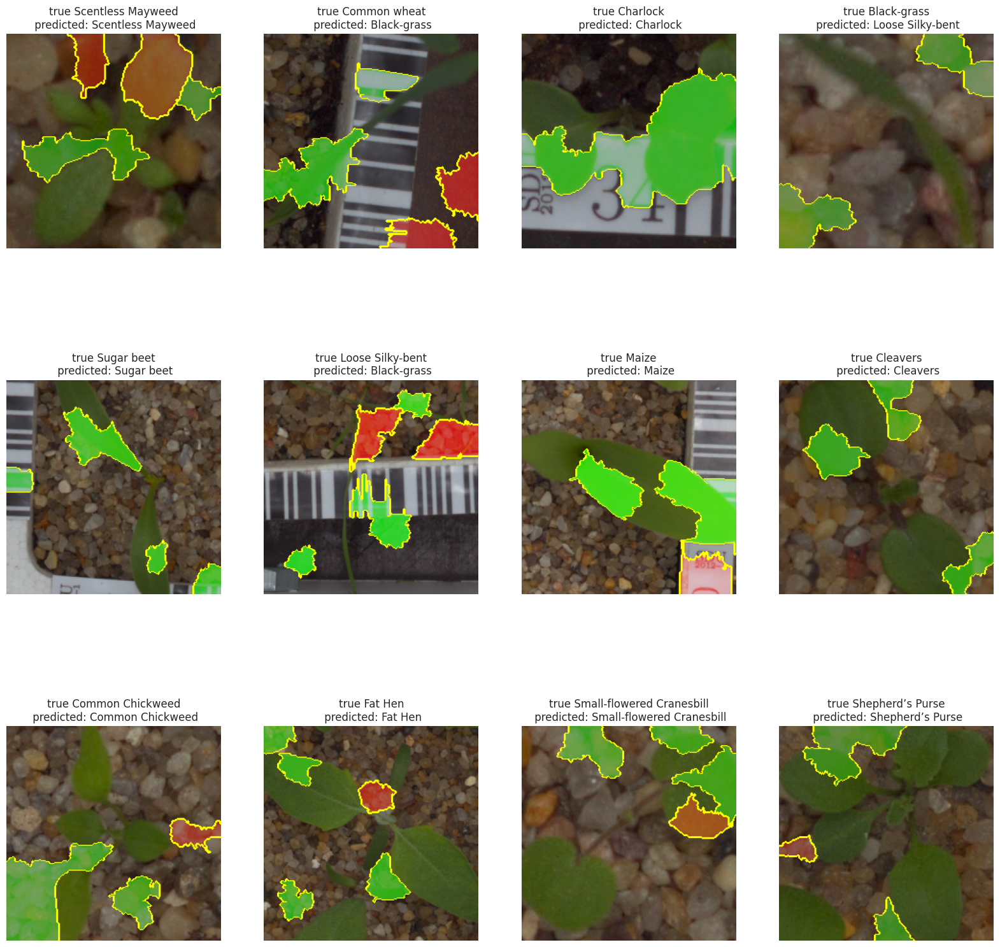

In [80]:
fig, ax = plt.subplots(3,4,figsize=(20,20))


m = 0
for i in range(3):
    for j in range(4):
        
        spec=org_plantstate.species.unique()[m]
        image_id = hold_out_data[hold_out_data.species==spec].image_name.values[0]
        image = Image.open(base_path + spec + "/" + image_id)
        image = image.convert('RGB')
        
        test_pred = batch_predict([pil_transf(image)])
        explainer = lime_image.LimeImageExplainer()

        explanation = explainer.explain_instance(np.array(pil_transf(image)), 
                                             batch_predict, # classification function
                                             top_labels=5, 
                                             hide_color=0, 
                                             num_samples=1000)
        temp, mask = explanation.get_image_and_mask(explanation.top_labels[0],
                                                    positive_only=False,
                                                    num_features=5,
                                                    hide_rest=False)
        img_boundry1 = mark_boundaries(temp/255.0, mask)
        predicted_target = np.argmax(test_pred)
        predicted_species = plantstate.loc[plantstate.target==predicted_target].species.unique()[0]
        ax[i,j].imshow(img_boundry1)
        ax[i,j].axis("off")
        ax[i,j].set_title("true " + spec + "\n predicted: " + predicted_species)
        
        m+=1

L'objectif principal de ce code est d'afficher visuellement comment le modèle de classification interprète différentes images en utilisant les explications LIME pour mettre en évidence les zones d'influence de l'image sur la prédiction du modèle. Chaque sous-graphique de la grille présente une image originale avec sa carte de chaleur et les étiquettes correspondantes de l'espèce réelle et prédite.
EN Montrant ainsi les régions importantes de chaque image qui influent sur la prédiction du modèle. Ces régions sont mises en évidence par des bordures dans les images générées.